In [ ]:
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.dates as mdates
%matplotlib inline
import tensorflow as tf
#from pathlib import Path
import os
from shutil import move, copy
from mpl_finance import candlestick2_ochl, volume_overlay

In [ ]:
!pip install mpl_finance

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [6]:
!unzip /content/gdrive/MyDrive/all_symbols.zip -d /content/all_symbols

Streaming output truncated to the last 5000 lines.
  inflating: /content/all_symbols/all_symbols/60days_150x150pixel+volume/validation/1/1غبشهر-811.png  
  inflating: /content/all_symbols/all_symbols/60days_150x150pixel+volume/validation/1/1خاذين-197.png  
  inflating: /content/all_symbols/all_symbols/60days_150x150pixel+volume/validation/1/1دفرا-1392.png  
  inflating: /content/all_symbols/all_symbols/60days_150x150pixel+volume/validation/1/1غمهرا-115.png  
  inflating: /content/all_symbols/__MACOSX/all_symbols/60days_150x150pixel+volume/validation/1/._1غمهرا-115.png  
  inflating: /content/all_symbols/all_symbols/60days_150x150pixel+volume/validation/1/1كچاد-1486.png  
  inflating: /content/all_symbols/all_symbols/60days_150x150pixel+volume/validation/1/1قمرو-1567.png  
  inflating: /content/all_symbols/all_symbols/60days_150x150pixel+volume/validation/1/1قهكمت-122.png  
  inflating: /content/all_symbols/__MACOSX/all_symbols/60days_150x150pixel+volume/validation/1/._1قهكمت-122.png  


In [7]:
# A function to get the number of images obtained from the previous function

def countImages(days, pic_size, use_volume):
    symbols = []
    path = '/content/all_symbols/'
    if use_volume:
        train_0 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel+volume/train/0".format(days, pic_size, pic_size)))
        train_1 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel+volume/train/1".format(days, pic_size, pic_size)))
        valid_0 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel+volume/validation/0".format(days, pic_size, pic_size)))
        valid_1 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel+volume/validation/1".format(days, pic_size, pic_size)))
    else:
        train_0 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel/train/0".format(days, pic_size, pic_size)))
        train_1 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel/train/1".format(days, pic_size, pic_size)))
        valid_0 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel/validation/0".format(days, pic_size, pic_size)))
        valid_1 = len(os.listdir("/content/all_symbols/all_symbols/{}days_{}x{}pixel/validation/1".format(days, pic_size, pic_size)))
    all_images = train_0 + train_1 + valid_0 + valid_1
    all_trains = train_0 + train_1
    all_valids = valid_0 + valid_1
    train_percentage = all_trains / all_images
    validation_percentage = all_valids / all_images
    print('All: {} images'.format(all_images))
    print('{} images for training, include {} images belongs to label 0 and {} belongs to 1.'.format(all_trains, train_0, train_1))
    print('{} images for validation, include {} images belongs to label 0 and {} belongs to 1.'.format(all_valids, valid_0, valid_1))
    print('{:2.2%} for training'.format(train_percentage))
    print('{:2.2%} for validation'.format(validation_percentage))

In [8]:
countImages(60, 150, True)

All: 593608 images
491291 images for training, include 256851 images belongs to label 0 and 234440 belongs to 1.
102317 images for validation, include 53877 images belongs to label 0 and 48440 belongs to 1.
82.76% for training
17.24% for validation


In [9]:
# Use a pre-trained model

In [15]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

local_weights_files = '/content/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

pre_trained_model = InceptionV3(input_shape = (150, 150, 3),
                                include_top = False,
                                weights = None)

pre_trained_model.load_weights(local_weights_files)

for layer in pre_trained_model.layers:
    layer.trainable = False

In [16]:
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d_3[0][0]']               
 alization)                                                                                       
                                                                                       

In [17]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape:', last_layer.output_shape)
last_output = last_layer.output

last layer output shape: (None, 7, 7, 768)


In [18]:
from tensorflow.keras.optimizers import RMSprop

x = tf.keras.layers.Flatten()(last_output)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(pre_trained_model.input, x)

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.0001),
              metrics=['accuracy'])

In [19]:
base_dir = '/content/all_symbols/all_symbols/60days_150x150pixel+volume'

train_dir = '/content/all_symbols/all_symbols/60days_150x150pixel+volume/train'
validation_dir = '/content/all_symbols/all_symbols/60days_150x150pixel+volume/validation'

train_0_dir = os.path.join(train_dir, '0')
train_1_dir = os.path.join(train_dir, '1')
validation_0_dir = os.path.join(validation_dir, '0')
validation_1_dir = os.path.join(validation_dir, '1')

train_0_fnames = os.listdir(train_0_dir)
train_1_fnames = os.listdir(train_1_dir)

train_datagen = ImageDataGenerator(rescale=1/255)
tst_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(150, 150),
                                                    batch_size=20,
                                                    class_mode='binary')

validation_generator = tst_datagen.flow_from_directory(validation_dir,
                                                    target_size=(150, 150),
                                                    batch_size=20,
                                                    class_mode='binary')

Found 491291 images belonging to 2 classes.
Found 102317 images belonging to 2 classes.


In [20]:
history = model.fit(
    train_generator,
    steps_per_epoch=100,
    epochs=300,
    validation_data=validation_generator,
    validation_steps=20,
    verbose=1)

Epoch 1/300
100/100 [==============================] - 13s 85ms/step - loss: 0.7971 - accuracy: 0.5225 - val_loss: 0.7058 - val_accuracy: 0.5425
Epoch 2/300
100/100 [==============================] - 7s 75ms/step - loss: 0.7182 - accuracy: 0.5135 - val_loss: 0.6766 - val_accuracy: 0.5750
Epoch 3/300
100/100 [==============================] - 7s 75ms/step - loss: 0.7001 - accuracy: 0.5225 - val_loss: 0.6843 - val_accuracy: 0.5475
Epoch 4/300
100/100 [==============================] - 7s 74ms/step - loss: 0.6975 - accuracy: 0.5125 - val_loss: 0.6849 - val_accuracy: 0.5300
Epoch 5/300
100/100 [==============================] - 7s 74ms/step - loss: 0.6935 - accuracy: 0.5105 - val_loss: 0.6830 - val_accuracy: 0.5575
Epoch 6/300
100/100 [==============================] - 7s 72ms/step - loss: 0.6906 - accuracy: 0.5180 - val_loss: 0.6807 - val_accuracy: 0.5250
Epoch 7/300
100/100 [==============================] - 7s 75ms/step - loss: 0.6883 - accuracy: 0.5195 - val_loss: 0.6970 - val_accuracy

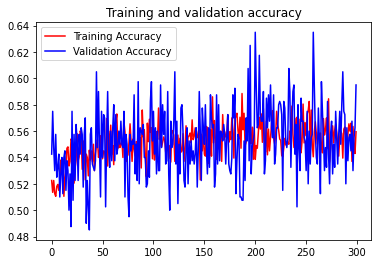

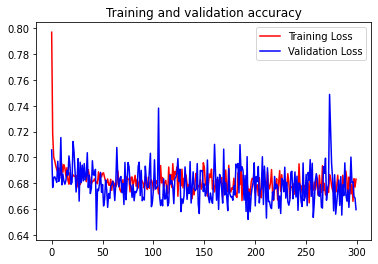

In [21]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure(figsize=(6, 4))

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.show()

In [10]:
path = '/content/all_symbols/all_symbols/60days_150x150pixel+volume'

In [11]:
# Create the model
size = int(path.split('/')[-1].split('_')[-1].split('x')[0])

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(size, size, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Show summary of the model
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 36, 36, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       7

In [12]:
# Compile the model
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['accuracy'])

In [13]:
# Prepare image to fit the model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1/255)
validation_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(os.path.join(path, 'train'),
                                                    target_size=(size, size),
                                                    batch_size=32,
                                                    class_mode='binary')
validation_generator = validation_datagen.flow_from_directory(os.path.join(path, 'validation'),
                                                    target_size=(size, size),
                                                    batch_size=32,
                                                    class_mode='binary')

Found 491291 images belonging to 2 classes.
Found 102317 images belonging to 2 classes.


In [14]:
history = model.fit(train_generator,
                    steps_per_epoch=100,
                    epochs=300,
                    validation_data=validation_generator,
                    validation_steps=50,
                    verbose=1)

Epoch 1/300
100/100 [==============================] - 19s 94ms/step - loss: 0.7084 - accuracy: 0.5372 - val_loss: 0.6921 - val_accuracy: 0.5531
Epoch 2/300
100/100 [==============================] - 9s 87ms/step - loss: 0.6918 - accuracy: 0.5391 - val_loss: 0.6823 - val_accuracy: 0.5725
Epoch 3/300
100/100 [==============================] - 8s 85ms/step - loss: 0.6813 - accuracy: 0.5437 - val_loss: 0.6713 - val_accuracy: 0.5425
Epoch 4/300
100/100 [==============================] - 9s 91ms/step - loss: 0.6763 - accuracy: 0.5512 - val_loss: 0.6775 - val_accuracy: 0.5669
Epoch 5/300
100/100 [==============================] - 9s 91ms/step - loss: 0.6769 - accuracy: 0.5694 - val_loss: 0.7045 - val_accuracy: 0.5763
Epoch 6/300
100/100 [==============================] - 9s 85ms/step - loss: 0.6698 - accuracy: 0.5697 - val_loss: 0.6687 - val_accuracy: 0.5512
Epoch 7/300
100/100 [==============================] - 10s 95ms/step - loss: 0.6751 - accuracy: 0.5659 - val_loss: 0.6662 - val_accurac

In [ ]:
# Show chart of the accuracy and loss for both training and validation
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))
plt.style.use('default')

plt.figure(figsize=(6, 4))
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)

plt.figure(figsize=(6, 4))
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


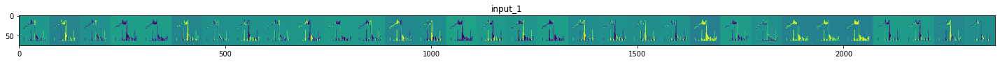

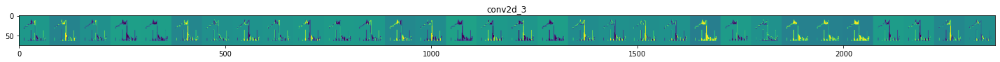

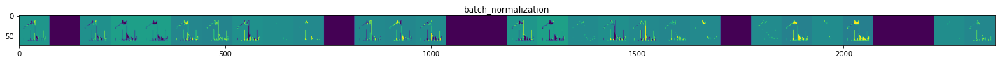

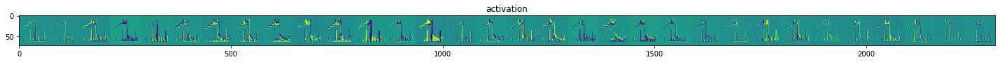

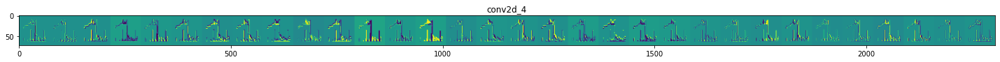

...

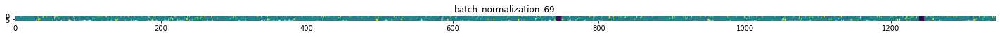

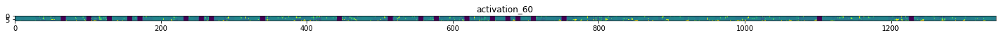

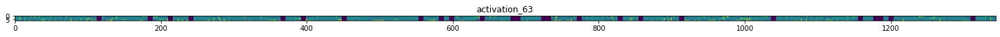

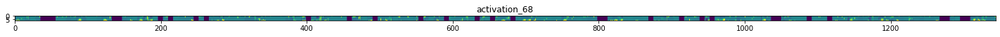

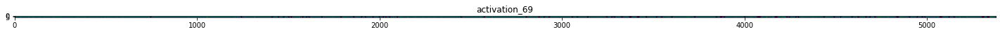

In [22]:
# Visualizing Intermediate Representations
# This is to get a feel for what features our convnet has learned.
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

train_0_dir = os.path.join(path, 'train', '0')
train_1_dir = os.path.join(path, 'train', '1')
validation_0_dir = os.path.join(path, 'validation', '0')
validation_1_dir = os.path.join(path, 'validation', '1')

train_0_names = os.listdir(train_0_dir)
train_1_names = os.listdir(train_1_dir)
validation_0_names = os.listdir(validation_0_dir)
validation_1_names = os.listdir(validation_1_dir)
    
successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
img_0_files = [os.path.join(train_0_dir, f) for f in train_0_names]
img_1_files = [os.path.join(train_1_dir, f) for f in train_1_names]
img_path = random.choice(img_0_files + img_1_files)
img = load_img(img_path, target_size=(size, size))

x = img_to_array(img)
x = x.reshape((1,) + x.shape)
x /= 255

successive_feature_maps = visualization_model.predict(x)
layer_names = [layer.name for layer in model.layers]

#plt.style.use('dark_background')
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
    if len(feature_map.shape) == 4:
        n_features = feature_map.shape[-1]
        size = feature_map.shape[1]
        display_grid = np.zeros((size, size * n_features))
        for i in range(n_features):
            x = feature_map[0, :, :, i]
            x -= x.mean()
            x /= x.std()
            x *= 64
            x += 128
            x = np.clip(x, 0, 255).astype('uint8')
            display_grid[:, i * size : (i + 1) * size] = x
        scale = 25. / n_features
        plt.figure(figsize=(scale * n_features, scale))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')